In [1]:
#Create Access to my code
import sys
sys.path.insert(1, '../vidr/')

#Import hte vaedr functions we have created
from vidr import VIDR
from PCAEval import PCAEval
from utils import *

#Import important modules
import scanpy as sc
import scgen as scg
import pandas as pd
import numpy as np
import torch
import seaborn as sns
from scipy import stats
from scipy import linalg
from scipy import spatial
from anndata import AnnData
from scipy import sparse
from statannotations.Annotator import Annotator
from matplotlib import pyplot as plt

sc.set_figure_params(dpi = 300, frameon = True)
sns.set_style("dark")

/mnt/home/kanaomar/miniconda3/lib/python3.9/site-packages/numba/np/ufunc/parallel.py:365: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 6103. The TBB threading layer is disabled.
  warnings.warn(problem)
OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [4]:
doses = [0, 0.01, 0.03, 0.1, 0.3, 1, 3, 10, 30]
adata = sc.read_h5ad("../data/nault2021_multiDose.h5ad")
cell_types_of_int = ["Hepatocytes - central", "Hepatocytes - portal", "Cholangiocytes", "Stellate Cells", "Portal Fibroblasts", "Endothelial Cells"]
adata = adata[adata.obs['celltype'].isin(cell_types_of_int)]

def is_hepatocyte(x:str):
    if "Hepatocytes" in x:
        return "Hepatocytes"
    else:
        return x

v_isHepatocyte = np.vectorize(is_hepatocyte)

celltypes = adata.obs["celltype"]
adata.obs["celltype2"] = celltypes
adata.obs["celltype"] = v_isHepatocyte(celltypes)

adata.obs["dose"] = [str(i) for i in adata.obs["Dose"]]

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=5000)
adata = adata[:, adata.var.highly_variable]

Trying to set attribute `.obs` of view, copying.


In [5]:
doses = [0.0,0.01, 0.03, 0.1, 0.3, 1.0, 3.0, 10.0, 30.0]

model_name = "VAE"

cell = "Hepatocytes"

train_adata, test_adata = prepare_data(adata, "celltype", "dose", cell, "30.0", normalized = True)
train_adata = setup_anndata(adata, copy = True, batch_key = "dose", labels_key="celltype")
print(f"\n Predicting {cell} Dioxin Dose Response\n")

model = VIDR(train_adata, linear_decoder = False, nca_loss = False)

model.train(
max_epochs=100,
batch_size=128,
early_stopping=True,
early_stopping_patience=25)

INFO     Using batches from adata.obs["dose"]                                                
INFO     Using labels from adata.obs["celltype"]                                             
INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 101346 cells, 5000 vars, 9        
         batches, 5 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          
INFO     Using batches from adata.obs["dose"]                                                
INFO     Using labels from adata.obs["celltype"]                                             
INFO     Using data from adata.X                            

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
Set SLURM handle signals.


Epoch 27/100:  27%|██▋       | 27/100 [07:53<21:19, 17.53s/it, loss=76.5, v_num=1]


In [6]:
model.save(f"../data/Continuous_Dioxin_VAE_{cell}.pt", overwrite = True)
model = model.load(f"../data/VAE_Cont_Prediction_Dioxin_5000g_{cell}.pt/", train_adata)

INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              
INFO     Registered keys:['X', 'batch_indices', 'local_l_mean', 'local_l_var', 'labels']     
INFO     Successfully registered anndata object containing 103745 cells, 5000 vars, 9        
         batches, 5 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
None


/mnt/home/kanaomar/miniconda3/lib/python3.9/site-packages/scvi/model/base/_base_model.py:147: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  warnings.warn(


In [7]:
latent_data = model.get_latent_representation()
latent_adata = sc.AnnData(X=latent_data , obs=train_adata.obs.copy(),)

In [8]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/mnt/home/kanaomar/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'celltype' as categorical
/mnt/home/kanaomar/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'dose' as categorical


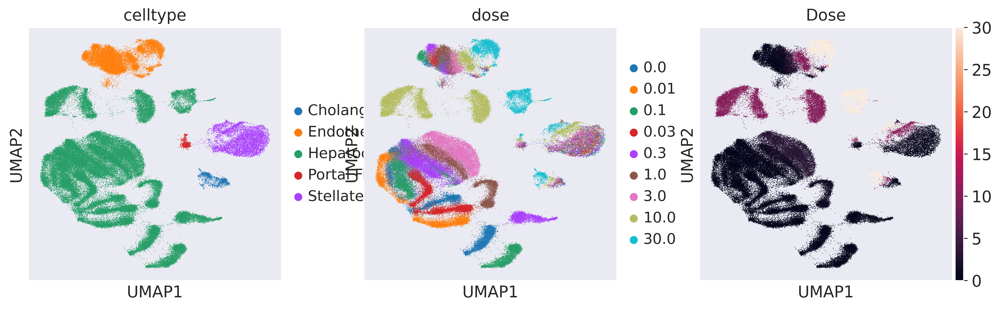

In [9]:
sc.pl.umap(latent_adata, color = ["celltype", "dose", "Dose"])

In [10]:
hep_latent_adata = latent_adata[latent_adata.obs["celltype"] == "Hepatocytes"]

In [11]:
mean_treat = np.average(hep_latent_adata[((hep_latent_adata.obs["celltype"] == "Hepatocytes") & (hep_latent_adata.obs["Dose"] == 30.0))].X, axis = 0)
mean_ctrl = np.average(hep_latent_adata[((hep_latent_adata.obs["celltype"] == "Hepatocytes") & (hep_latent_adata.obs["Dose"] == 0))].X, axis = 0)
delta = mean_treat - mean_ctrl

In [12]:
delta

ArrayView([-1.5908594 , -0.7789223 , -1.6158879 , -1.4761918 ,
            7.473415  ,  5.559472  ,  6.484432  ,  0.3703618 ,
            0.02829731, -5.4236245 ,  5.7453275 ,  2.2943373 ,
           -0.93482494, -0.368765  ,  2.5927205 ,  5.6672025 ,
            1.2594086 ,  0.36797523, -2.1124659 ,  1.5700024 ,
           -2.5969675 , -4.3866515 ,  1.2291341 ,  5.048762  ,
            0.46821594, -3.1810694 , -3.713352  ,  0.10406089,
            1.9408138 , -1.2964935 , -5.362129  , -9.050259  ,
           -6.3919587 , -2.5839808 , -0.11159652,  2.0792854 ,
            2.0623562 , -1.2838833 , -0.62048364, -2.535976  ,
            4.378879  , -0.04124534, -3.584529  , -0.20999141,
            1.2496918 ,  8.430087  ,  1.4514724 ,  5.211666  ,
            0.16987807,  2.827426  , -2.9365125 ,  4.2647195 ,
            0.01951849, -0.24185073, -2.3631287 ,  0.25263762,
           -0.99487025, -3.020894  , -3.471105  , -1.5591799 ,
            1.1599275 ,  4.625957  , -0.7811835 , -0.45

In [13]:
pt_values = []
for i in hep_latent_adata.X:
    pt_value = np.dot(i,delta)/np.dot(delta,delta)
    pt_values.append(pt_value)

pseudodose = np.array(pt_values)

In [14]:
hep_latent_adata.obs["pseudodose"] = pseudodose
# meta = pd.read_csv("../data/dose-response.metadata.txt", sep = '\t')
# meta.index = np.concatenate([[i+dose_ids[d] for i in meta[meta['Dose']==d].index]  for d in doses])

Trying to set attribute `.obs` of view, copying.


In [15]:
hep_latent_adata.obs["Log Dose"] = np.log1p(hep_latent_adata.obs["Dose"])

In [16]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 2, svd_solver = 'arpack')
pca_mod = pca.fit(hep_latent_adata.X)
hep_latent_adata.obsm["X_pca"] = pca_mod.transform(hep_latent_adata.X)
coef = np.linspace(-0.5, 2.5, 1000)
delta_points = np.array([i*delta for i in coef])
delta_pca = pca_mod.transform(delta_points)

# Figure 5A 

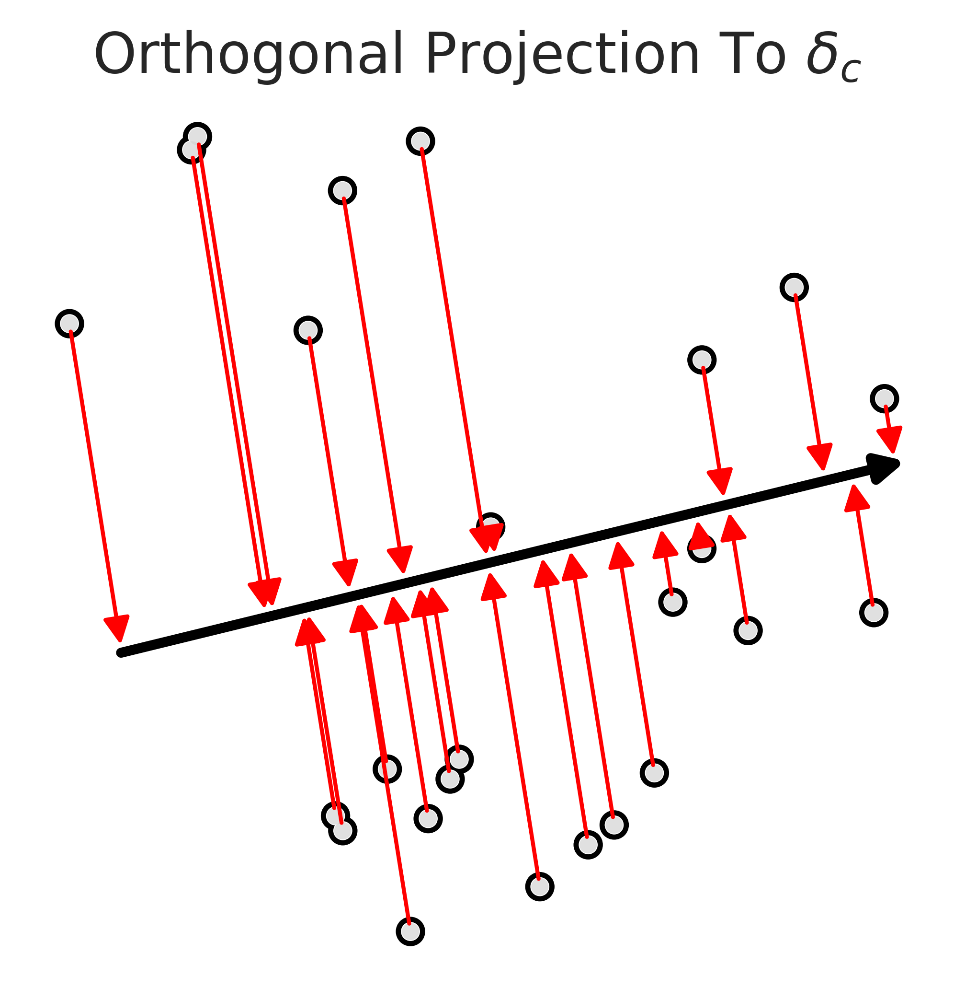

In [19]:
np.random.seed(15)
rand_samp = hep_latent_adata[np.random.randint(0, hep_latent_adata.shape[0], size = (25))]
ax = sc.pl.pca(rand_samp,  frameon=False, return_fig=True, title = [None], size=75, add_outline = True)

v = pca_mod.transform(delta[np.newaxis, :])[0]
plt.annotate('',xy=(v[0]*0.95, v[1]*0.95),
             xycoords='data',
             xytext=(v[0]*-0.85, v[1]*-0.85),
             textcoords='data',
             arrowprops=dict(arrowstyle= '-|>',
                             color='black',
                             lw=2.5,
                             ),
           )
for x in rand_samp.obsm["X_pca"]:
    orth_proj  = (np.dot(v, x)/np.dot(v, v)) * v
    plt.annotate('',xy=(orth_proj[0], orth_proj[1]),
             xycoords='data',
             xytext=(x[0], x[1]),
             textcoords='data',
             arrowprops=dict(arrowstyle= '-|>',
                             color='red',
                             lw=1,
                             )
           )
plt.title(r"Orthogonal Projection To $\delta_c$")
plt.savefig("../figures/5A.svg")
plt.show()

In [21]:
hep_adata = adata[adata.obs.celltype == "Hepatocytes"]

In [22]:
hep_adata.obs["pseudo-dose"] = pseudodose

Trying to set attribute `.obs` of view, copying.


In [23]:
pca = PCA(n_components = 2, svd_solver = 'arpack')
pca_mod = pca.fit(hep_adata.X)
hep_adata.obsm["X_pca"] = pca_mod.transform(hep_adata.X)
coef = np.linspace(min(pseudodose)-2.5, max(pseudodose), 100)
delta_points = np.array([i*delta for i in coef])
proj_delta = model.module.generative(torch.Tensor(delta_points))["px"].cpu().detach().numpy()
delta_pca = pca_mod.transform(proj_delta)

# Figure 5B

/mnt/home/kanaomar/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Zones' as categorical


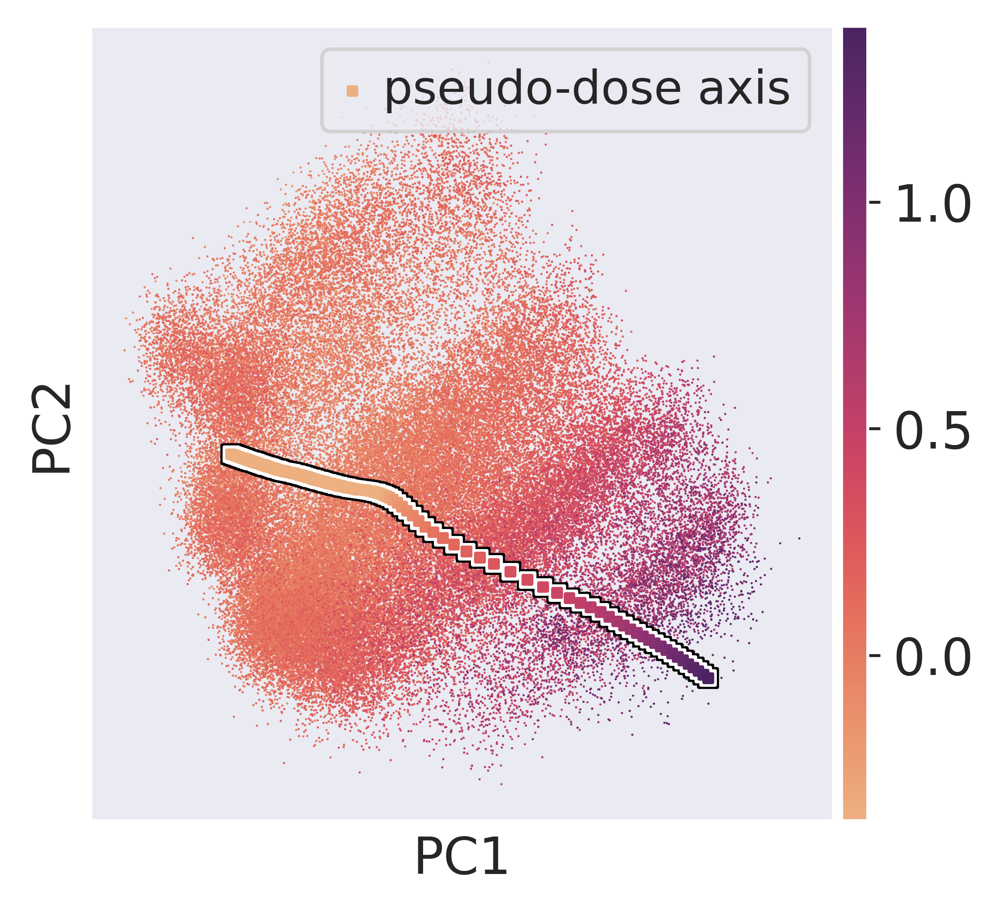

In [27]:
ax = sc.pl.pca(hep_adata, color=['pseudo-dose'], wspace=0.4, frameon=True, return_fig=True, cmap="flare", title = "")
plt.scatter(delta_pca[:, 0], delta_pca[:, 1], s = 25, marker = "s", c = "black")
plt.scatter(delta_pca[:, 0], delta_pca[:, 1], s = 15, marker = "s", c = "white")
plt.scatter(delta_pca[:, 0], delta_pca[:, 1], s = 5, marker = "s", label = "pseudo-dose axis", c = [min(pseudodose) if i < min(pseudodose) else i for i in coef], cmap = "flare")
plt.legend()
plt.savefig("../figures/5B.svg")
plt.show()

In [28]:
hep_adata.obs["Zones"] = ["Central" if i == "Hepatocytes - central" else "Portal" for i in hep_adata.obs["celltype2"]]

In [30]:
hep_adata.obs["Log Dose"] = np.log1p(hep_adata.obs["Dose"])

# Figure 5C

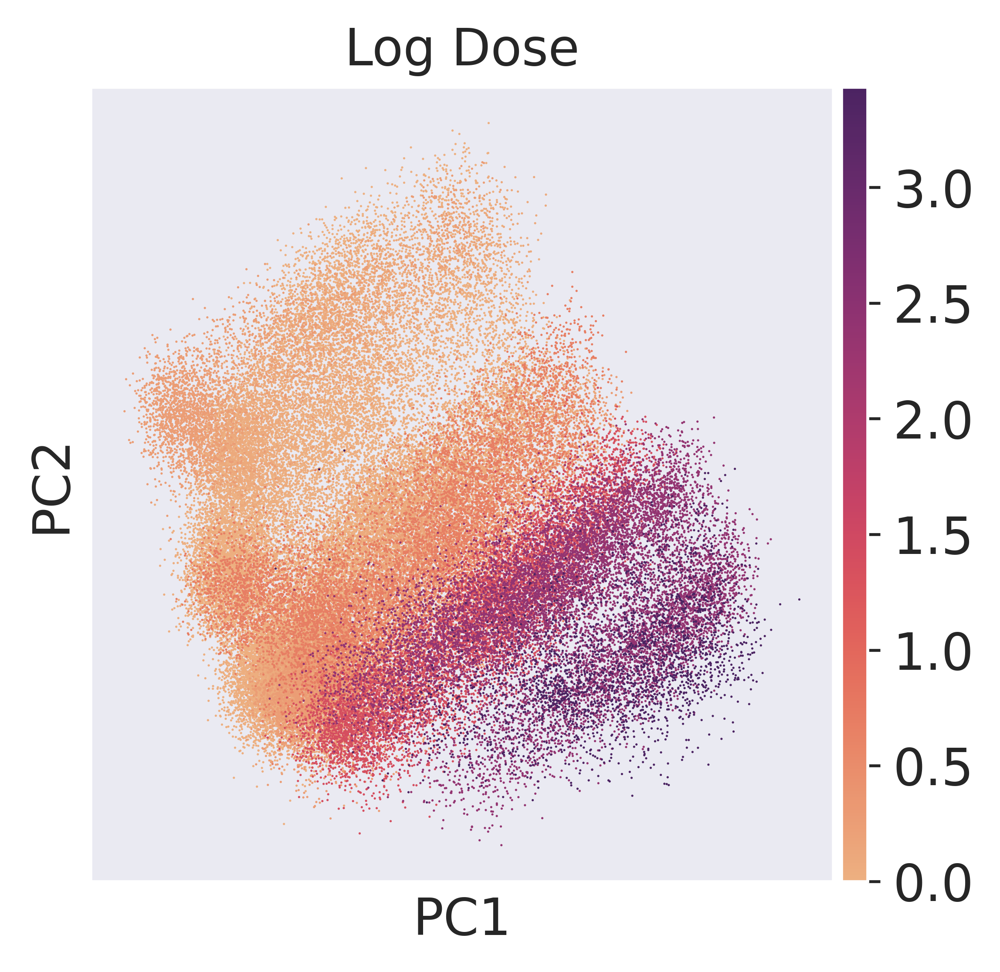

In [31]:
ax = sc.pl.pca(hep_adata, color=['Log Dose'], wspace=0.4, frameon=True, return_fig=True, cmap="flare")
plt.savefig("../figures/5C.svg")

In [49]:
sns.set_style("darkgrid")

In [50]:
def sigmoid(x, L, k, x0, b):
    y = L / (1 + np.exp(-k*(x-x0)))+b
    return (y)

In [51]:
from scipy.optimize import curve_fit
from sklearn.metrics import mean_absolute_error

In [52]:
top_lin_genes = adata.var_names[np.argsort(pt_r2_scores)[::-1]][:100]

In [53]:
top_gene = 'Fmo3'

In [54]:
df = pd.DataFrame({"Dose":hep_adata.obs["Dose"].values, "Pseudodose":hep_adata.obs["pseudo-dose"].values,  
                   "Hepatocyte Zones":hep_adata.obs["Zones"].values, top_gene:hep_adata[:, top_gene].X.squeeze()})
x = df["Pseudodose"].values
y = df[top_gene].values

In [55]:
bounds = ((1., 0., min(pseudodose),-5.), (15.,50.,max(pseudodose), 5.))
p0 = [1.0, 1.0, 1.0, 1.0]
popt, pcov = curve_fit(sigmoid, x, y, p0, method='trf', 
                       maxfev = 10000, bounds = bounds)

In [56]:
popt

array([ 1.9149075 , 14.82530381,  0.3509117 , -0.02009366])

# Figure 5D

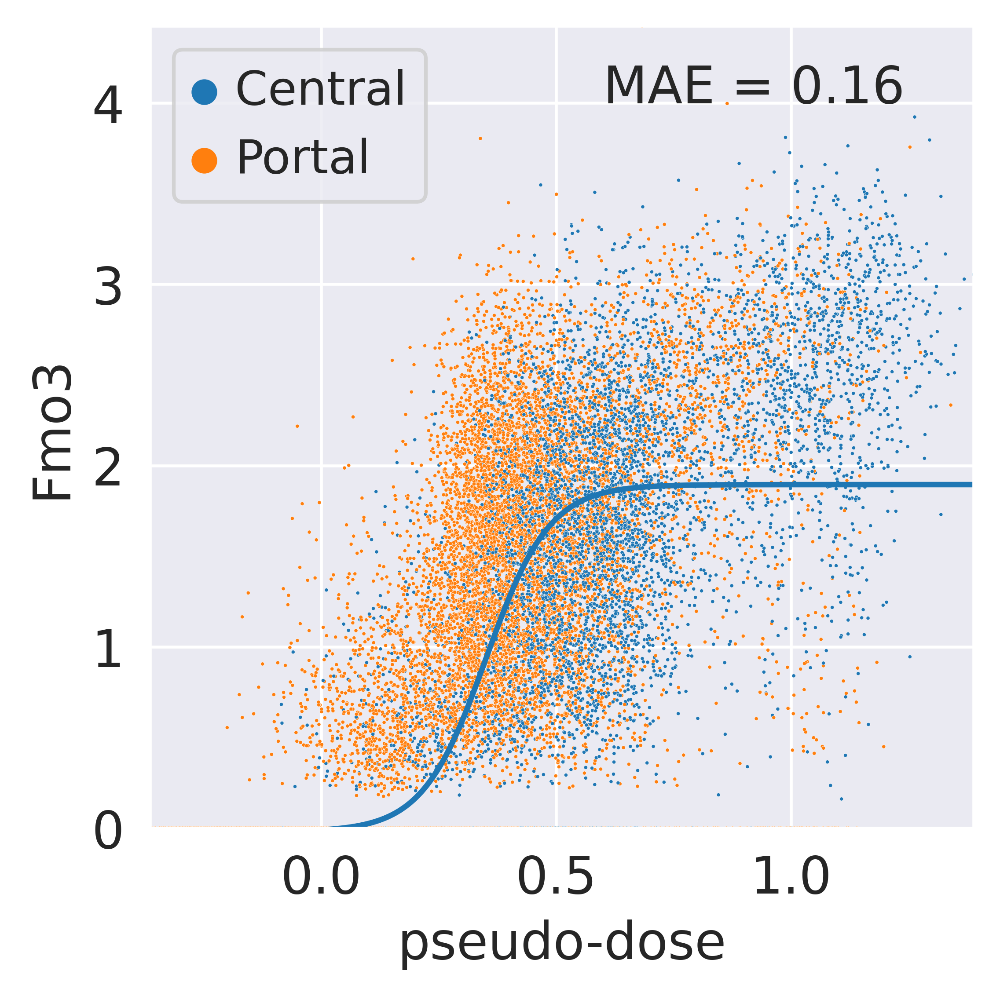

In [57]:
df = pd.DataFrame({"Dose":hep_adata.obs["Dose"].values, "Pseudodose":hep_adata.obs["pseudo-dose"].values,  
                   "Hepatocyte Zones":hep_adata.obs["Zones"].values, top_gene:hep_adata[:, top_gene].X.squeeze()})
ax = sns.scatterplot(x = "Pseudodose", y = top_gene, hue = "Hepatocyte Zones", data = df, s = 1)
r2 = stats.linregress(x = df["Pseudodose"], y = df[top_gene])
r2 = mean_absolute_error(y, sigmoid(x, *popt))
sns.lineplot(x = x, y = sigmoid(x, *popt))
plt.ylim(min(df[top_gene]), max(df[top_gene]))
plt.xlim(min(df["Pseudodose"]), max(df["Pseudodose"]))
plt.xlabel("pseudo-dose")
plt.annotate(f"MAE = {r2:.{2}}", (0.6, 4))
plt.savefig("../figures/5D.svg")

# Figure 5E

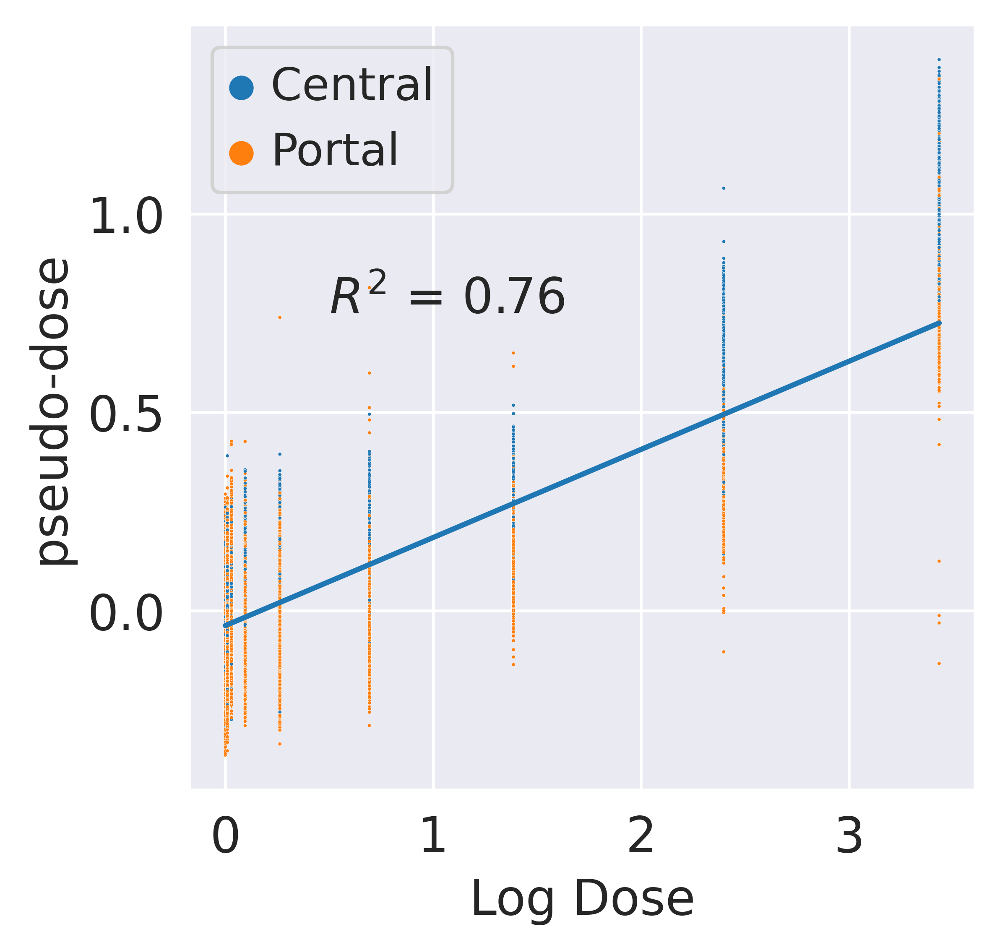

In [58]:
df = pd.DataFrame({"Log Dose":hep_adata.obs["Log Dose"].values, "Pseudodose":hep_adata.obs["pseudo-dose"].values,  
                   "Hepatocyte Zones":hep_adata.obs["Zones"].values, top_gene:hep_adata[:, top_gene].X.squeeze()})

x = df["Log Dose"].values
y = df["Pseudodose"].values

ax = sns.scatterplot(x = "Log Dose", y = "Pseudodose", hue = "Hepatocyte Zones", data = df, s = 1)
m, b, r, p, _ = stats.linregress(x =x, y =y)
sns.lineplot(x = x, y = x*m+b)
plt.annotate(f"$R^2$ = {r**2:.{2}}", (0.5, 0.75))
plt.ylabel("pseudo-dose")
plt.savefig("../figures/5E.svg")

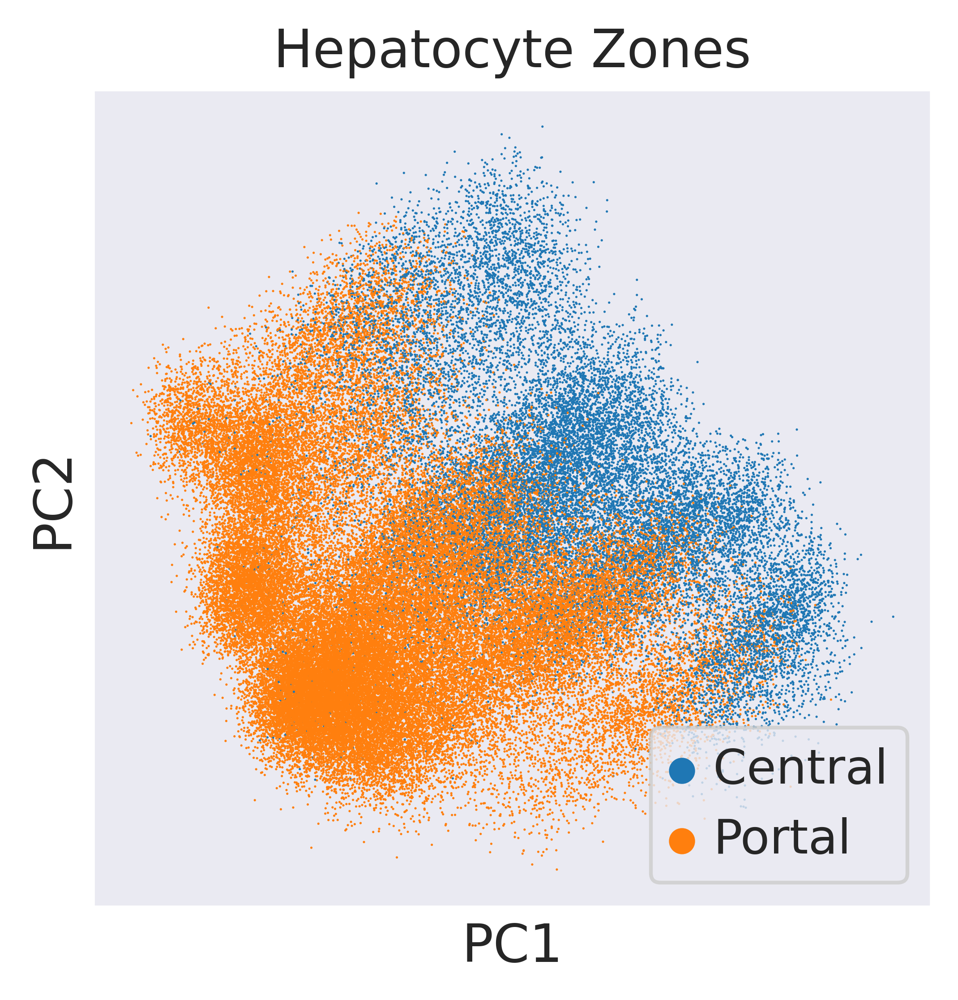

In [59]:
ax = sc.pl.pca(hep_adata, color = ['Zones'], frameon=True, return_fig=True, title = ["Hepatocyte Zones"])
plt.legend(loc = 'lower right')
plt.show()

# Figure 5F

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Central vs. Portal: Mann-Whitney-Wilcoxon test greater, P_val:0.000e+00 U_stat=7.984e+08


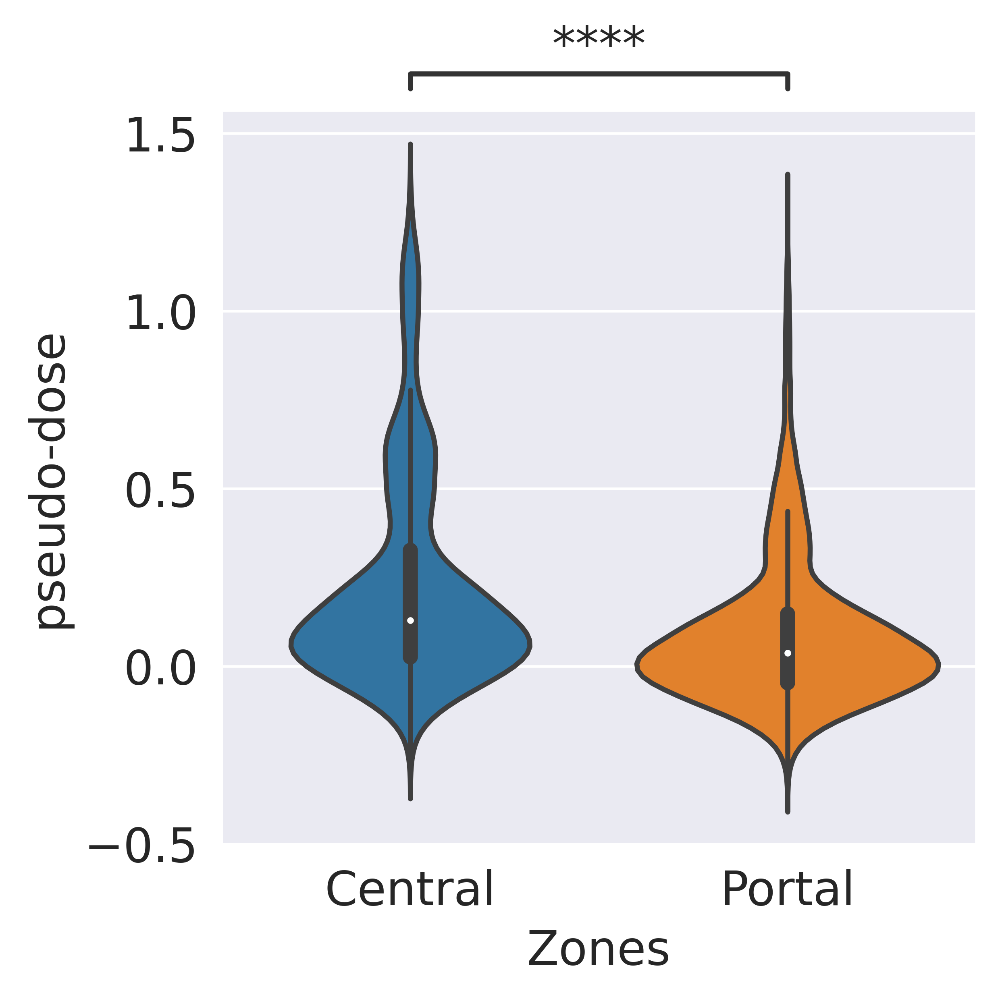

In [60]:
df = hep_adata.obs
pairs = [('Central', 'Portal')]
ax  = sns.violinplot(x = "Zones", y = "pseudo-dose", data = df)
annotator = Annotator(ax, pairs, data=df, x="Zones", y="pseudo-dose")
annotator.configure(test='Mann-Whitney-gt', text_format='star', loc='outside')
annotator.apply_and_annotate()
plt.savefig("../figures/5F.svg")